## Técnicas de precificação de opções
Tal como acontece com outras técnicas de precificação de opções, os métodos de Monte Carlo são usados ​​para precificar opções usando o que é essencialmente um processo de três etapas.

* Etapa 1: Simule as possíveis trajetórias de preços do ativo subjacente.
* Etapa 2: calcule o payoff da opção para cada um desses caminhos de preço.
* Etapa 3: calcule a média do payoff e do desconto até hoje para determinar o preço da opção

In [2]:
import pandas as pd 
from numpy import *
import matplotlib.pyplot as plt
import cufflinks as cf
cf.set_config_file(offline=True)


In [3]:
v = arange(1,10)
v

array([1, 2, 3, 4, 5, 6, 7, 8, 9])

In [4]:
2*v

array([ 2,  4,  6,  8, 10, 12, 14, 16, 18])

In [5]:
def simulate(s0, mu, sigma, horizon, timesteps, n_sims):
    random.seed(10000)
    s0 = s0
    r = mu
    T = horizon
    t = timesteps
    n = n_sims

    dt = T/t

    s = zeros((t+1,n))
    s[0] = s0

    for i in range(1, t+1):
        z = random.standard_normal(n)
        s[i] = s[i-1] * exp((r - 0.5 * sigma ** 2) * dt + sigma * sqrt(dt) * z)
    return s

In [6]:
S = zeros((10,20))
S

array([[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0.]])

In [7]:
zt = random.standard_normal(100000)
zt

array([-1.14206619,  1.83336443,  0.24813984, ..., -0.42526957,
       -2.22812103, -0.6981094 ])

In [8]:
for i in range(1,5):
    print(i, 100*random.standard_normal(5))

1 [   3.45020034   83.25158301  114.09865587  -52.14141571 -139.80754572]
2 [ -65.22846055  -14.38718991   22.49573413  147.33011296 -260.35744684]
3 [  89.22063022  -66.9963899    69.64100513 -159.03864481  -83.62868346]
4 [-116.2993778   187.73161354   93.31032358   21.87997247   12.64487643]


In [9]:
spath = simulate(100,0.05,0.2,1,252,100000)
spath.shape

(253, 100000)

In [10]:
random.seed(10000)
z_sn = random.standard_normal(100000)
z_sn.shape, z_sn.mean(), z_sn.std()


((100000,), 0.0015478685920003361, 0.9999493876956002)

In [11]:
pd.DataFrame(random.standard_normal(100000)).iplot(kind='histogram',
                                                   title='Historgram of a Standard Normal Random Numbers',
                                                   color='cornflowerblue')


In [12]:
price_path = pd.DataFrame(simulate(100, 0.05, 0.20, 1, 252, 100000))

# Verify the generated price paths
price_path.tail()


,0,1,2,3,4,5,6,7,8,9,...,99990,99991,99992,99993,99994,99995,99996,99997,99998,99999
248,122.744116,73.726256,130.300175,85.189213,97.832185,145.078927,80.238957,115.570249,146.166446,92.363360,...,115.268251,97.785460,77.997978,125.746500,66.248592,101.359439,98.117755,106.427116,116.403264,88.053283
249,123.481394,75.683974,129.657857,83.829975,98.647390,145.796634,79.768302,115.431777,143.233227,92.761168,...,113.820214,98.806408,78.179687,123.540823,67.150401,102.689798,97.286120,107.246420,117.029213,88.093302
250,120.425574,74.540613,129.857575,83.173612,99.329872,145.326902,79.856524,114.917017,145.739873,94.496627,...,112.924580,100.028868,79.705226,123.337220,67.575219,102.027625,97.845233,105.380055,119.285472,90.154848
251,121.041764,74.274111,130.494232,82.587781,97.291661,143.060354,80.695230,111.935555,147.320979,95.150662,...,112.504629,99.577606,80.501443,122.850952,66.989567,102.092763,98.906659,107.483858,119.385760,86.898010
252,119.614091,76.158298,129.412627,81.065594,98.140474,143.715903,82.260569,111.930403,149.914686,94.996926,...,113.464643,99.783934,81.659347,124.103865,66.765986,102.196988,98.788117,107.454989,122.229576,86.254176


In [14]:
price_path.mean(axis=1)

0      100.000000
1      100.021793
2      100.035001
3      100.049323
4      100.069283
          ...    
248    104.958353
249    104.979582
250    105.003346
251    105.028318
252    105.049635
Length: 253, dtype: float64

In [16]:
price_path.iloc[-1].iplot(kind='histogram',
                          title='Simulando Geometria Brownian ', bins=100)


In [17]:
price_path.iloc[:,:100].iplot(title='Simulação movimento browniano geometrico', xTitle='Tempo', yTitle='Indice')

Text(0.5, 1.0, 'Monte Carlo Simulated Asset Prices')

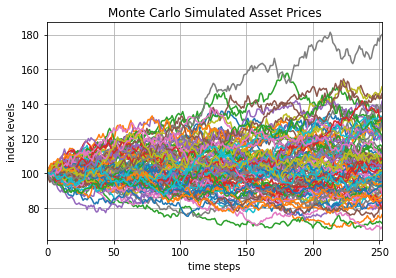

In [19]:
# Plot initial 100 simulated path using matplotlib
S = simulate(100, 0.05, 0.20, 1, 252, 100000)
plt.plot(S[:, :100])
plt.grid(True)
plt.xlabel('time steps')
plt.xlim(0, 252)
plt.ylabel('index levels')
plt.title('Monte Carlo Simulated Asset Prices')


In [20]:
n = 100000

z = random.standard_normal(n)
z.mean(), z.std()

(-0.0013212338752583508, 1.0038084669874554)

In [23]:
print('%11s %11s' % ('Mean', 'Std. Deviation'))
print(31*'-')
for i in range(1,11):
    random.seed(10000)
    sn = random.standard_normal(i**2*10000)
    print("%15.12f %15.12f" % (sn.mean(), sn.std()))


       Mean Std. Deviation
-------------------------------
-0.007599646936  0.993952113627
 0.002172884539  0.998313345022
 0.002225583121  1.000217645410
-0.000111961560  0.998652583104
-0.002467749429  0.998560787725
-0.001323351787  0.999106892333
-0.003065752578  0.998807812778
-0.002555368674  0.998763344066
-0.001532005844  0.999146506311
-0.001364771400  0.999371817155


In [25]:
10**2*10000/2


500000.0

In [26]:
print('Without Antithetic Variates')
print('Mean ', sn.mean())
print('Standard deviation', sn.std())



Without Antithetic Variates
Mean  -0.0013647713997682277
Standard deviation 0.9993718171552612


In [27]:
print("%11s %11s" % ('Mean', 'Std. Deviation'))
print(31 * "-")

for i in range(1, 11):
    random.seed(10000)
    sn = random.standard_normal(int(i**2*10000/2))
    sna = concatenate((sn, -sn), axis=0)
    print("%15.12f %15.12f" % (sna.mean(), sna.std()))


       Mean Std. Deviation
-------------------------------
-0.000000000000  0.992666333135
-0.000000000000  0.996307849803
-0.000000000000  0.997410035672
-0.000000000000  1.000276630789
 0.000000000000  0.998282781298
-0.000000000000  0.998462027560
 0.000000000000  0.998205464660
 0.000000000000  0.998713653167
 0.000000000000  0.999213411064
 0.000000000000  0.998796747062


In [28]:
print('With Antithetic Variates')
print('Mean ', sna.mean())
print('Standard deviation', sna.std())


With Antithetic Variates
Mean  1.8829382497642655e-19
Standard deviation 0.9987967470615127
